## Importing Dependencies

In [47]:
##
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt
import numpy as np
import seaborn as sns
import time
import warnings
warnings.filterwarnings('ignore')

# Visualization Tools
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

# AI and Machine Learning Tools
#from sklearn.linear_model import LinearRegression
#from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
#from sklearn.metrics import r2_score
from tensorflow import keras


## Evaluation
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, mean_squared_error, classification_report
from sklearn.metrics import r2_score, roc_curve, balanced_accuracy_score, roc_auc_score

# **PART 1A:** Reading Datasets, Preliminary Data Analysis Explorations

## Loading and Reading the Datasest

In [48]:
# Reading the dataset
# Stocks List  = ['AAPL','NVDA','MSFT','AMZN','GOOGL','META','CSCO','INTC','QQQ','SPY','CVX','XOM','BA','CAT','GS','AXP','HD','IBM','JNJ','KO'] '
stocks_df = pd.read_csv('/content/stcks_df.csv', parse_dates=['Date'], index_col='Date').dropna()
stocks_df.head(3)

,AAPL,AMZN,AXP,BA,CAT,CSCO,CVX,GOOGL,GS,HD,IBM,INTC,JNJ,KO,META,MSFT,NVDA,QQQ,SPY,XOM
Date,,,,,,,,,,,,,,,,,,,,
2012-05-18 00:00:00+00:00,15.996172,10.6925,46.533325,57.249630,63.887566,11.279345,59.677826,14.987913,75.709747,35.358429,116.428940,18.292822,44.516636,25.100883,38.115242,23.443844,0.276979,54.290005,103.318832,49.654617
2012-05-21 00:00:00+00:00,16.928110,10.9055,47.314480,59.427006,66.264969,11.416314,60.423359,15.330158,76.518456,35.779289,117.546387,18.348953,44.600960,25.256802,33.927845,23.828302,0.281794,55.807716,105.094696,50.002022
2012-05-22 00:00:00+00:00,16.798122,10.7665,47.331264,59.178638,65.911972,11.457406,60.199085,14.997898,77.327133,36.267761,116.987648,18.264761,44.636089,25.148336,30.906942,23.836313,0.278355,55.745228,105.277847,49.947166


In [49]:
volume_df = pd.read_csv('/content/new_volume.csv', parse_dates=['Date'], index_col='Date').dropna()
volume_df.head(3)

,AAPL,AMZN,AXP,BA,CAT,CSCO,CVX,GOOGL,GS,HD,IBM,INTC,JNJ,KO,META,MSFT,NVDA,QQQ,SPY,XOM
Date,,,,,,,,,,,,,,,,,,,,
2012-05-18 00:00:00+00:00,732292400.0,104634000.0,8783700.0,5597400,8655900,57520600.0,11137700,238701060.0,7184700.0,12962200.0,6001007,43444900.0,13781300,31913000,573576400.0,56205300.0,567288000.0,79496500.0,319615900.0,21747200
2012-05-21 00:00:00+00:00,631106000.0,71596000.0,4568600.0,4709700,6811300,37628500.0,6169400,122892984.0,5314700.0,12713000.0,4007958,41389400.0,8784900,13488800,168192700.0,38787900.0,416260000.0,61473000.0,177861100.0,13730400
2012-05-22 00:00:00+00:00,694870400.0,74662000.0,5858600.0,4269400,7210500,42979200.0,6089700,121953924.0,5839700.0,15028300.0,3731187,46037700.0,8409300,15260600,101786600.0,39504900.0,410140000.0,62954800.0,197531200.0,13790000


In [50]:
# tickers = list(stocks_df.columns)
# tickers
print(stocks_df.columns)

Index(['AAPL', 'AMZN', 'AXP', 'BA', 'CAT', 'CSCO', 'CVX', 'GOOGL', 'GS', 'HD',
       'IBM', 'INTC', 'JNJ', 'KO', 'META', 'MSFT', 'NVDA', 'QQQ', 'SPY',
       'XOM'],
      dtype='object')


## Exploratory Data Analysis **EDA**

In [51]:
stocks_df = stocks_df.sort_values(by = ['Date'])

In [52]:
stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3112 entries, 2012-05-18 00:00:00+00:00 to 2024-10-01 00:00:00+00:00
Data columns (total 20 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    3112 non-null   float64
 1   AMZN    3112 non-null   float64
 2   AXP     3112 non-null   float64
 3   BA      3112 non-null   float64
 4   CAT     3112 non-null   float64
 5   CSCO    3112 non-null   float64
 6   CVX     3112 non-null   float64
 7   GOOGL   3112 non-null   float64
 8   GS      3112 non-null   float64
 9   HD      3112 non-null   float64
 10  IBM     3112 non-null   float64
 11  INTC    3112 non-null   float64
 12  JNJ     3112 non-null   float64
 13  KO      3112 non-null   float64
 14  META    3112 non-null   float64
 15  MSFT    3112 non-null   float64
 16  NVDA    3112 non-null   float64
 17  QQQ     3112 non-null   float64
 18  SPY     3112 non-null   float64
 19  XOM     3112 non-null   float64
dtypes: float64(20)
memory usag

In [53]:
stocks_df.shape

(3112, 20)

In [54]:
round(stocks_df.describe(),2).T

,count,mean,std,min,25%,50%,75%,max
AAPL,3112.0,75.27,63.06,11.95,24.37,42.16,136.92,234.55
AMZN,3112.0,80.84,57.58,10.41,21.83,81.38,130.17,200.00
AXP,3112.0,105.86,49.34,44.88,69.03,90.05,144.97,271.20
BA,3112.0,187.26,87.84,55.67,118.60,172.10,228.05,430.30
CAT,3112.0,134.39,78.71,46.75,68.17,114.09,189.20,392.73
CSCO,3112.0,32.97,13.17,10.40,20.58,35.57,45.52,58.72
CVX,3112.0,94.83,31.39,44.37,72.99,84.22,98.56,174.99
GOOGL,3112.0,68.08,43.69,13.96,30.13,54.65,102.46,190.93
GS,3112.0,217.46,95.28,72.49,144.19,188.50,302.09,510.25
HD,3112.0,178.38,100.54,35.36,91.66,159.38,277.41,405.20


In [55]:
stocks_df.isnull().sum()

,0
AAPL,0
AMZN,0
AXP,0
BA,0
CAT,0
CSCO,0
CVX,0
GOOGL,0
GS,0
HD,0


In [56]:
stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3112 entries, 2012-05-18 00:00:00+00:00 to 2024-10-01 00:00:00+00:00
Data columns (total 20 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    3112 non-null   float64
 1   AMZN    3112 non-null   float64
 2   AXP     3112 non-null   float64
 3   BA      3112 non-null   float64
 4   CAT     3112 non-null   float64
 5   CSCO    3112 non-null   float64
 6   CVX     3112 non-null   float64
 7   GOOGL   3112 non-null   float64
 8   GS      3112 non-null   float64
 9   HD      3112 non-null   float64
 10  IBM     3112 non-null   float64
 11  INTC    3112 non-null   float64
 12  JNJ     3112 non-null   float64
 13  KO      3112 non-null   float64
 14  META    3112 non-null   float64
 15  MSFT    3112 non-null   float64
 16  NVDA    3112 non-null   float64
 17  QQQ     3112 non-null   float64
 18  SPY     3112 non-null   float64
 19  XOM     3112 non-null   float64
dtypes: float64(20)
memory usag

## Visualization and Analysis of Stock Data

In [57]:
def show_plot(stocks_df, fig_title):
    stocks_df.plot(figsize=(15, 10), title=fig_title, fontsize=8)
    plt.grid(True)
    plt.show()

### Portfolio (All Stocks) Visualization

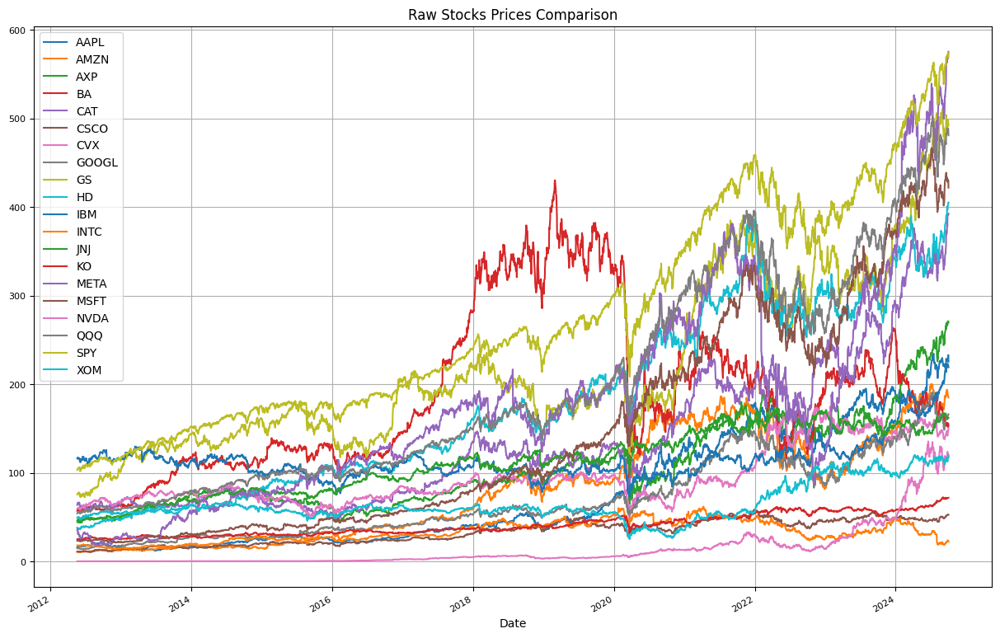

In [58]:
show_plot(stocks_df, 'Raw Stocks Prices Comparison')

### Interactive Plots

In [59]:
def interactive_plot(stocks_df, title):
    fig = px.line(title=title)#, figsize=(15, 10))

    for i in stocks_df.columns[1:]:
        fig.add_scatter(x=stocks_df.index,y=stocks_df[i],name=i,
           #mode='lines+markers',
            hovertemplate=f'Security: {i}<br>Index: %{{x}}<br>Value: %{{y}}<extra></extra>'
        )
    fig.show()

In [60]:
#figsize= (15,15),
interactive_plot(stocks_df, title='Interactive Stocks Prices Visuallization')

### Normalizing the Data

In [61]:
def normalize(stocks_df):
    x = stocks_df.copy()
    for i in x.columns[0:]:
        x[i] = x[i] / x[i].iloc[0]
    return x

In [62]:
normalized_stocks = normalize(stocks_df)
#normalized_stocks.head(3)

### Interactive Visualization of Nomalized Prices

In [63]:
#normalized_stocks
interactive_plot(normalized_stocks, title='Interactive Normalized Prices Visuallization')

# **PART 1B:** Volume Analysis and Visualization

### Exploring The Volume Dataset


In [64]:
volume_df = volume_df.sort_values(by = ['Date'])

In [65]:
stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3112 entries, 2012-05-18 00:00:00+00:00 to 2024-10-01 00:00:00+00:00
Data columns (total 20 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    3112 non-null   float64
 1   AMZN    3112 non-null   float64
 2   AXP     3112 non-null   float64
 3   BA      3112 non-null   float64
 4   CAT     3112 non-null   float64
 5   CSCO    3112 non-null   float64
 6   CVX     3112 non-null   float64
 7   GOOGL   3112 non-null   float64
 8   GS      3112 non-null   float64
 9   HD      3112 non-null   float64
 10  IBM     3112 non-null   float64
 11  INTC    3112 non-null   float64
 12  JNJ     3112 non-null   float64
 13  KO      3112 non-null   float64
 14  META    3112 non-null   float64
 15  MSFT    3112 non-null   float64
 16  NVDA    3112 non-null   float64
 17  QQQ     3112 non-null   float64
 18  SPY     3112 non-null   float64
 19  XOM     3112 non-null   float64
dtypes: float64(20)
memory usag

In [66]:
def show_plot(volume_df, fig_title):
    volume_df.plot(figsize=(15, 8), title=fig_title, fontsize=8)
    plt.grid(True)
    plt.show()

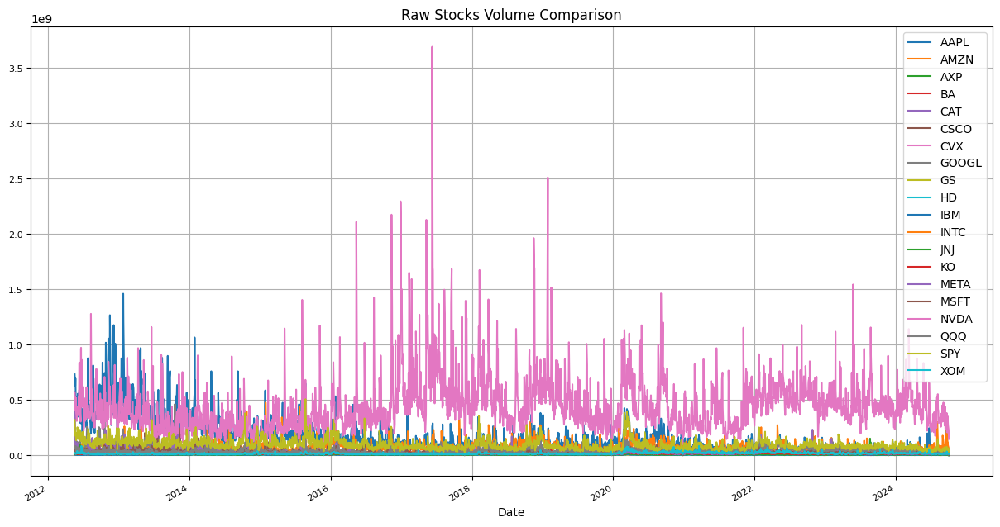

In [67]:
show_plot(volume_df, 'Raw Stocks Volume Comparison')

### Interactive Volume Visualization

In [68]:
# interactive_plot(volume_df, 'Interactive Stock Volume')

### Interactive Visualization of Normalized Volume Data

In [69]:
interactive_plot(normalize(volume_df), 'Normalized Stock Volume Visualization')

In [70]:
# interactive_plot(normalize(volume_df), 'Normalized Stock Volume')

##

# **PART 2A:** Daily Returns of Stocks in Porfolio

### Calculating Daily Returns of Stocks

In [71]:
def daily_return(stocks_df):
    df_daily_return = stocks_df.copy()

    # Initialize the first row to 0 for daily returns
    df_daily_return.iloc[0] = 0

    # Loop over columns starting from the second column
    for i in stocks_df.columns[0:]:
        for j in range(1, len(stocks_df)):
            df_daily_return.iloc[j][i] = ((stocks_df.iloc[j][i] - stocks_df.iloc[j-1][i]) / stocks_df.iloc[j-1][i]) * 100

    return df_daily_return

In [72]:
stocks_df.shape

(3112, 20)

In [73]:
stocks_df_daily_return = daily_return(stocks_df)
display(stocks_df_daily_return.head(3))
display(stocks_df_daily_return.tail(3))

,AAPL,AMZN,AXP,BA,CAT,CSCO,CVX,GOOGL,GS,HD,IBM,INTC,JNJ,KO,META,MSFT,NVDA,QQQ,SPY,XOM
Date,,,,,,,,,,,,,,,,,,,,
2012-05-18 00:00:00+00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2012-05-21 00:00:00+00:00,5.826007,1.992053,1.678699,3.803301,3.721230,1.21434,1.249263,2.283474,1.068169,1.190269,0.959767,0.306849,0.189421,0.621166,-10.986148,1.639913,1.738426,2.795564,1.718819,0.699642
2012-05-22 00:00:00+00:00,-0.767881,-1.274586,0.035475,-0.417937,-0.532705,0.35994,-0.371170,-2.167363,1.056840,1.365237,-0.475335,-0.458840,0.078764,-0.429449,-8.903904,0.033619,-1.220505,-0.111971,0.174273,-0.109706


,AAPL,AMZN,AXP,BA,CAT,CSCO,CVX,GOOGL,GS,HD,IBM,INTC,JNJ,KO,META,MSFT,NVDA,QQQ,SPY,XOM
Date,,,,,,,,,,,,,,,,,,,,
2024-09-27 00:00:00+00:00,0.118666,-1.668760,1.085215,1.125634,0.030692,0.321669,2.464962,0.749709,0.319970,0.713382,-1.159198,-0.041807,0.006193,0.546218,-0.084538,-0.762794,-2.128345,-0.555703,-0.145032,2.677302
2024-09-30 00:00:00+00:00,2.287197,-0.872479,0.051654,-2.737982,0.010230,0.377218,1.223451,1.158896,-0.682037,1.419171,0.108678,-1.882061,0.408924,0.097506,0.895378,0.532685,0.032950,0.271188,0.400728,1.208774
2024-10-01 00:00:00+00:00,-3.188838,-0.681589,-0.547572,1.973165,0.411642,-0.854945,1.792625,0.274336,-0.682671,-0.006176,-0.906914,-3.516619,0.080220,0.146112,0.490881,-1.966068,-3.005519,-1.467003,-0.813926,2.055960


### Visualizing Porfolio Daily Returns

In [74]:
# show_plot(stocks_df_daily_return, 'Stocks Daily Returns')

### Plotting the Cummulative Daily Retuns of stocks in Porfolio

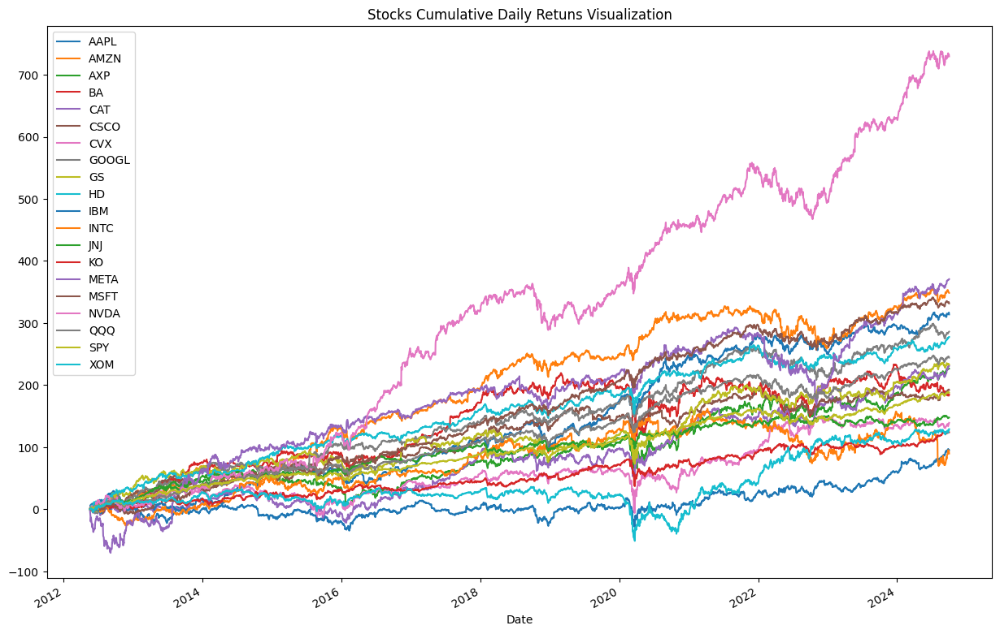

In [75]:
## Cummulative Daily Returns of Stocks
stock_daily_returns_cumsum = stocks_df_daily_return.cumsum().plot(figsize=(15, 10), title="Stocks Cumulative Daily Retuns Visualization");

### Interactive Cummulative Daily Retuns of stocks in Porfolio

In [76]:
def interactive_plot(stocks_df_daily_return, title):
    fig = px.line(title=title)#, figsize=(15, 10))

    for i in stocks_df_daily_return.columns[1:]:
        fig.add_scatter(x=stocks_df_daily_return.index,y=stocks_df_daily_return[i],name=i,
           #mode='lines+markers',
            hovertemplate=f'Security: {i}<br>Index: %{{x}}<br>Value: %{{y}}<extra></extra>'
        )
    fig.show()


In [77]:
interactive_plot(stocks_df_daily_return,"Stocks Cumulative Daily Retuns Visualization");

In [79]:
interactive_plot(stocks_df_daily_return.cumsum(), 'Interactive Stocks Cumulative Daily Returns')

## **Porfolio Visualizations**
    * Coorelation Tables
    * Heat Map
    * Histplot

#### Correlations Table

In [81]:
Correlations_plot = stocks_df_daily_return.corr()
Correlations_plot = round(Correlations_plot, 2)
#Correlations_plot

In [82]:
## Calculation for correlations for the variables
Correlations_plot = stocks_df_daily_return.corr()
# Define a function to apply colors based on values on correlation_df
def color_negative_red(val):
    color = 'gray' if val < 0.500 else 'lime'
    return 'color: %s' % color

# Display the DataFrame with color-coded cells
corr_styled_df = Correlations_plot.style.map(color_negative_red)
corr_styled_df
#round(corr_styled_df,2)

,AAPL,AMZN,AXP,BA,CAT,CSCO,CVX,GOOGL,GS,HD,IBM,INTC,JNJ,KO,META,MSFT,NVDA,QQQ,SPY,XOM
AAPL,1.000000,0.486388,0.390388,0.367689,0.373579,0.473516,0.315481,0.548918,0.437258,0.460417,0.370968,0.453927,0.315967,0.329446,0.425081,0.602998,0.498258,0.776117,0.696029,0.287395
AMZN,0.486388,1.000000,0.320974,0.289073,0.294349,0.385808,0.213445,0.616168,0.358697,0.402319,0.281892,0.390818,0.236280,0.222235,0.504056,0.593233,0.482350,0.725707,0.610186,0.195759
AXP,0.390388,0.320974,1.000000,0.572066,0.532494,0.448003,0.545279,0.430387,0.670850,0.485212,0.478753,0.401437,0.366320,0.455823,0.296179,0.443957,0.359772,0.553661,0.701194,0.508364
BA,0.367689,0.289073,0.572066,1.000000,0.468082,0.365022,0.482018,0.360838,0.529610,0.421432,0.409274,0.384893,0.290699,0.387586,0.256459,0.361730,0.320773,0.493344,0.603285,0.463776
CAT,0.373579,0.294349,0.532494,0.468082,1.000000,0.448697,0.563533,0.361586,0.596688,0.425244,0.480989,0.395045,0.330945,0.349554,0.232173,0.391590,0.346441,0.508107,0.639487,0.564146
CSCO,0.473516,0.385808,0.448003,0.365022,0.448697,1.000000,0.408140,0.454035,0.475567,0.467409,0.509425,0.478742,0.437015,0.405057,0.302591,0.536926,0.414064,0.626003,0.666976,0.389897
CVX,0.315481,0.213445,0.545279,0.482018,0.563533,0.408140,1.000000,0.323906,0.555007,0.402185,0.455624,0.348703,0.367501,0.403493,0.206893,0.350808,0.257705,0.427557,0.608885,0.832245
GOOGL,0.548918,0.616168,0.430387,0.360838,0.361586,0.454035,0.323906,1.000000,0.444035,0.452407,0.377206,0.442036,0.322520,0.334792,0.537523,0.665866,0.513677,0.776665,0.704930,0.294647
GS,0.437258,0.358697,0.670850,0.529610,0.596688,0.475567,0.555007,0.444035,1.000000,0.519117,0.496656,0.436297,0.378045,0.393855,0.317920,0.469736,0.390147,0.594940,0.735291,0.526969
HD,0.460417,0.402319,0.485212,0.421432,0.425244,0.467409,0.402185,0.452407,0.519117,1.000000,0.448165,0.425626,0.398316,0.431724,0.333509,0.514087,0.413663,0.629578,0.707573,0.346399


#### Visualizing Portfolio Returns with HeatMap

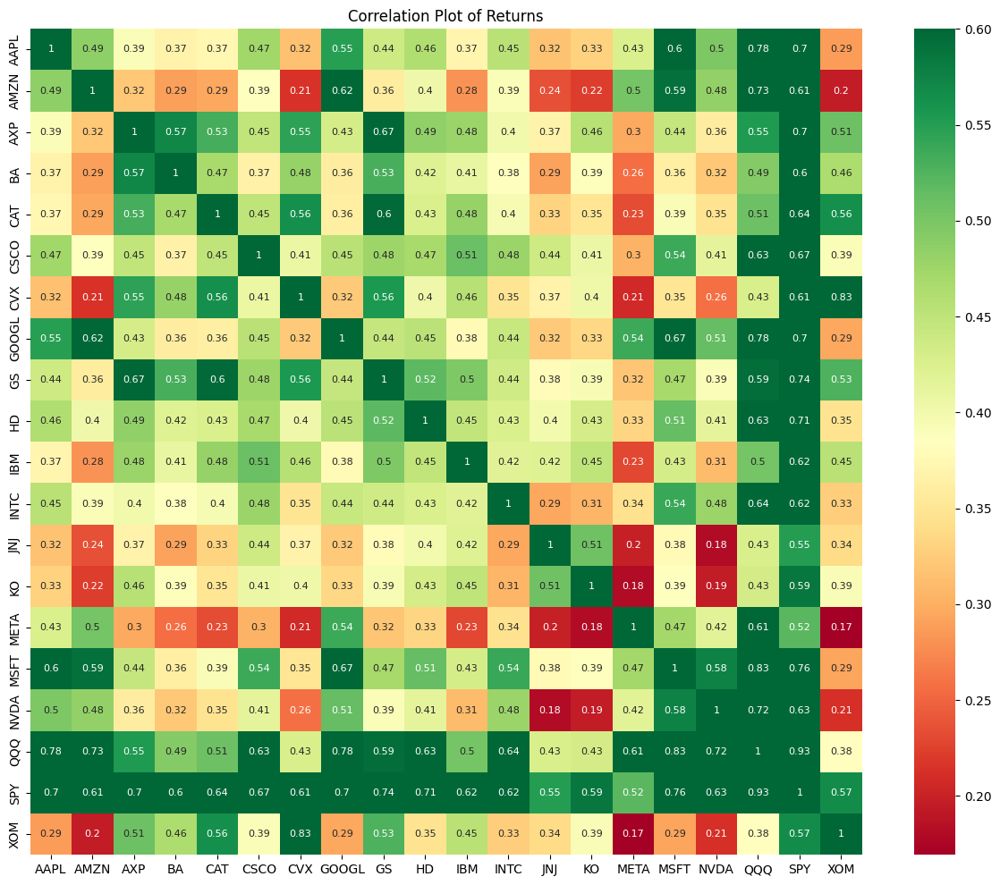

In [83]:
# Correlations_plot
plt.figure(figsize=(15,12))
plt.fontsize=7,
plt.title('Correlation Plot of Returns')
plt.colormaps=('RdYlGn')
sns.heatmap(Correlations_plot, annot=True, cmap="RdYlGn",annot_kws={"size": 8}, vmax=0.60);

#### Visualization of Stocks Volatility with Histplot

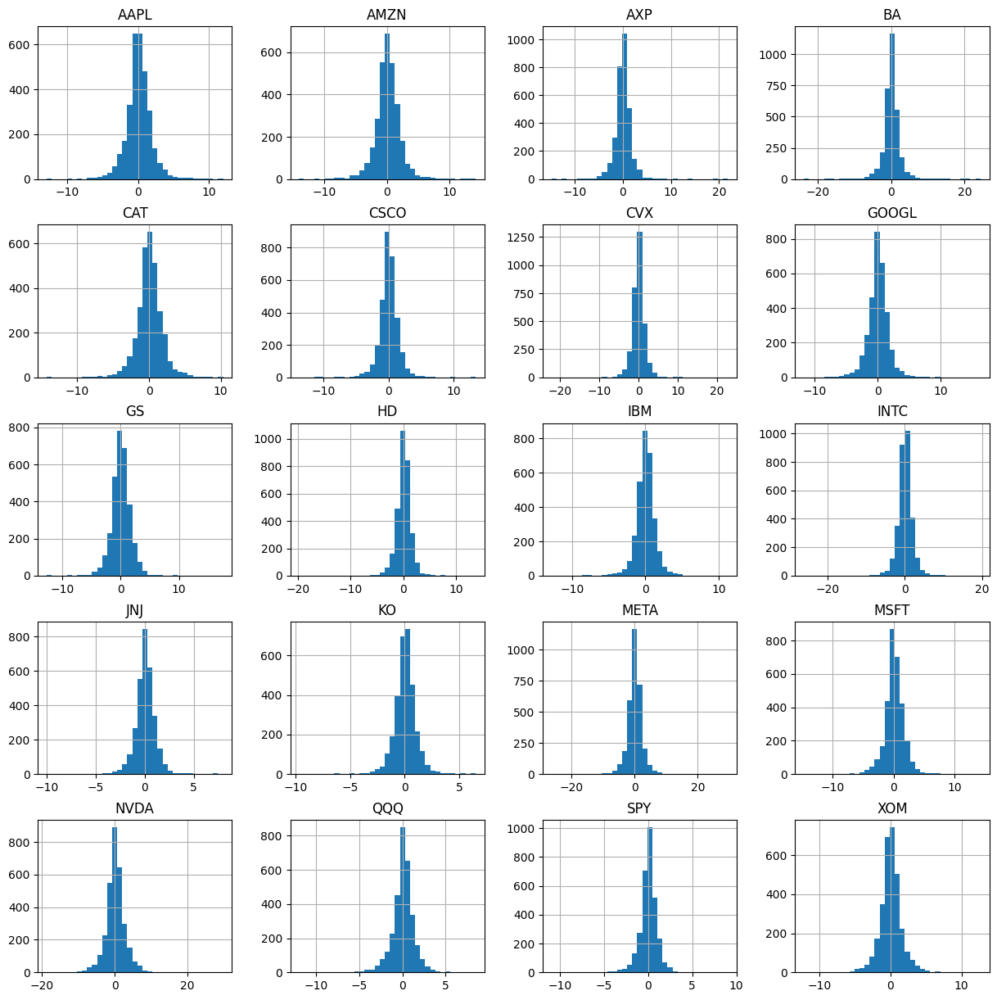

In [84]:
stocks_df_daily_return.hist(bins=35, figsize=(15,15));

### **Observation and Inferences:** Volatility Comparism Among Stocks.
    * wider base equals higher volatility and higher price fluctuation ranges. eg NVDA vs XOM.
    * NVDA has a higher volatility with a range of (-20 to +20) vs
    * XOM has a lower volatility with a range of (-10 to +10)

##

### Returns of Equal Weighted Portfolio

In [85]:
### checking data shape
stocks_df.shape

(3112, 20)

#### Calculating the weights

In [86]:
num_stocks = 20
weights = [1 / num_stocks] * num_stocks
weights
# Portfolio >> 5% Equal Weighted of each Stock in Play

[0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05]

In [87]:
# Percentage change (retunrs) in price from prior day
returnX_df = stocks_df.pct_change(1)  # 1 day lookback
returnX_df.head(3)

,AAPL,AMZN,AXP,BA,CAT,CSCO,CVX,GOOGL,GS,HD,IBM,INTC,JNJ,KO,META,MSFT,NVDA,QQQ,SPY,XOM
Date,,,,,,,,,,,,,,,,,,,,
2012-05-18 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-05-21 00:00:00+00:00,0.058260,0.019921,0.016787,0.038033,0.037212,0.012143,0.012493,0.022835,0.010682,0.011903,0.009598,0.003068,0.001894,0.006212,-0.109861,0.016399,0.017384,0.027956,0.017188,0.006996
2012-05-22 00:00:00+00:00,-0.007679,-0.012746,0.000355,-0.004179,-0.005327,0.003599,-0.003712,-0.021674,0.010568,0.013652,-0.004753,-0.004588,0.000788,-0.004294,-0.089039,0.000336,-0.012205,-0.001120,0.001743,-0.001097


In [88]:
## Returns Covariance Matrix
#Covariance: Covariance is a statistical measure that indicates the extent to which two variables change together
vcv_matrix = returnX_df.cov()
vcv_matrix



,AAPL,AMZN,AXP,BA,CAT,CSCO,CVX,GOOGL,GS,HD,IBM,INTC,JNJ,KO,META,MSFT,NVDA,QQQ,SPY,XOM
AAPL,0.000315,0.000174,0.000126,0.000153,0.000118,0.000131,0.000097,0.000167,0.000133,0.000120,0.000094,0.000168,0.000061,0.000064,0.000191,0.000177,0.000251,0.000178,0.000130,0.000083
AMZN,0.000174,0.000408,0.000118,0.000137,0.000106,0.000121,0.000075,0.000213,0.000125,0.000119,0.000081,0.000164,0.000052,0.000049,0.000257,0.000198,0.000276,0.000189,0.000129,0.000064
AXP,0.000126,0.000118,0.000329,0.000243,0.000171,0.000127,0.000172,0.000134,0.000209,0.000129,0.000124,0.000152,0.000072,0.000090,0.000136,0.000133,0.000185,0.000130,0.000133,0.000150
BA,0.000153,0.000137,0.000243,0.000547,0.000194,0.000133,0.000195,0.000144,0.000213,0.000144,0.000137,0.000187,0.000074,0.000099,0.000151,0.000140,0.000213,0.000149,0.000148,0.000176
CAT,0.000118,0.000106,0.000171,0.000194,0.000315,0.000124,0.000173,0.000110,0.000182,0.000110,0.000122,0.000146,0.000064,0.000068,0.000104,0.000115,0.000174,0.000116,0.000119,0.000163
CSCO,0.000131,0.000121,0.000127,0.000133,0.000124,0.000242,0.000110,0.000121,0.000127,0.000106,0.000113,0.000155,0.000074,0.000069,0.000119,0.000138,0.000183,0.000126,0.000109,0.000099
CVX,0.000097,0.000075,0.000172,0.000195,0.000173,0.000110,0.000300,0.000096,0.000165,0.000102,0.000113,0.000126,0.000069,0.000076,0.000091,0.000100,0.000127,0.000096,0.000111,0.000234
GOOGL,0.000167,0.000213,0.000134,0.000144,0.000110,0.000121,0.000096,0.000292,0.000130,0.000113,0.000092,0.000157,0.000060,0.000062,0.000232,0.000188,0.000249,0.000171,0.000126,0.000082
GS,0.000133,0.000125,0.000209,0.000213,0.000182,0.000127,0.000165,0.000130,0.000295,0.000130,0.000122,0.000156,0.000070,0.000074,0.000138,0.000133,0.000190,0.000132,0.000132,0.000147
HD,0.000120,0.000119,0.000129,0.000144,0.000110,0.000106,0.000102,0.000113,0.000130,0.000214,0.000094,0.000130,0.000063,0.000069,0.000123,0.000124,0.000172,0.000119,0.000108,0.000082


In [89]:
# vcv_matrix.describe()

In [90]:
3 ## Mapping positively Covarying stocks
Correlations_plot = returnX_df.cov()

# Define a function to apply colors based on values on correlation_df
def color_negative_red(val):
    color = 'gray' if val < 0.0002 else 'lime'
    return 'color: %s' % color

# Display the DataFrame with color-coded cells
corr_styled_df = Correlations_plot.style.map(color_negative_red)
corr_styled_df
#round(corr_styled_df,2)

,AAPL,AMZN,AXP,BA,CAT,CSCO,CVX,GOOGL,GS,HD,IBM,INTC,JNJ,KO,META,MSFT,NVDA,QQQ,SPY,XOM
AAPL,0.000315,0.000174,0.000126,0.000153,0.000118,0.000131,0.000097,0.000167,0.000133,0.000120,0.000094,0.000168,0.000061,0.000064,0.000191,0.000177,0.000251,0.000178,0.000130,0.000083
AMZN,0.000174,0.000408,0.000118,0.000137,0.000106,0.000121,0.000075,0.000213,0.000125,0.000119,0.000081,0.000164,0.000052,0.000049,0.000257,0.000198,0.000276,0.000189,0.000129,0.000064
AXP,0.000126,0.000118,0.000329,0.000243,0.000171,0.000127,0.000172,0.000134,0.000209,0.000129,0.000124,0.000152,0.000072,0.000090,0.000136,0.000133,0.000185,0.000130,0.000133,0.000150
BA,0.000153,0.000137,0.000243,0.000547,0.000194,0.000133,0.000195,0.000144,0.000213,0.000144,0.000137,0.000187,0.000074,0.000099,0.000151,0.000140,0.000213,0.000149,0.000148,0.000176
CAT,0.000118,0.000106,0.000171,0.000194,0.000315,0.000124,0.000173,0.000110,0.000182,0.000110,0.000122,0.000146,0.000064,0.000068,0.000104,0.000115,0.000174,0.000116,0.000119,0.000163
CSCO,0.000131,0.000121,0.000127,0.000133,0.000124,0.000242,0.000110,0.000121,0.000127,0.000106,0.000113,0.000155,0.000074,0.000069,0.000119,0.000138,0.000183,0.000126,0.000109,0.000099
CVX,0.000097,0.000075,0.000172,0.000195,0.000173,0.000110,0.000300,0.000096,0.000165,0.000102,0.000113,0.000126,0.000069,0.000076,0.000091,0.000100,0.000127,0.000096,0.000111,0.000234
GOOGL,0.000167,0.000213,0.000134,0.000144,0.000110,0.000121,0.000096,0.000292,0.000130,0.000113,0.000092,0.000157,0.000060,0.000062,0.000232,0.000188,0.000249,0.000171,0.000126,0.000082
GS,0.000133,0.000125,0.000209,0.000213,0.000182,0.000127,0.000165,0.000130,0.000295,0.000130,0.000122,0.000156,0.000070,0.000074,0.000138,0.000133,0.000190,0.000132,0.000132,0.000147
HD,0.000120,0.000119,0.000129,0.000144,0.000110,0.000106,0.000102,0.000113,0.000130,0.000214,0.000094,0.000130,0.000063,0.000069,0.000123,0.000124,0.000172,0.000119,0.000108,0.000082


# **PART 2B:** Portfolio Returns Annualized


In [91]:
## Calculating Annualized

def get_port_return(weights, returnX_df):
    return np.sum(returnX_df.mean() * weights) * 252


In [92]:
num_stocks = len(returnX_df.columns)
weights = [1 / num_stocks] * num_stocks
#weights

In [93]:
## Returns

result = get_port_return(weights, returnX_df) * 100
print(result)
print(round(result, 4))
#### **Portfolio Returns Annualized** >> 19.7706% **(20.00% )**

19.770561195492753
19.7706


# **PART 2C:** Investment Risk Analysis

### Portfilio Investment Risk Analysis
* Calcualting Std and Variance for Portfolio
* Comparing Portfolio Risk to Individual Stock Risks
* Diversification Helps to Lower Risks of Investments in Stocks

In [94]:
# Calculating the DAILY variance and Standard deviation of portfolio

var_p = np.dot(np.transpose(weights), np.dot(vcv_matrix, weights))
std_p = np.sqrt(var_p)
print(std_p)
print(round(std_p, 6)*100)

0.011777582827809253
1.1778


In [95]:
# Calculating the Stdandard Deviation for the ANNUAL Returns

std_p_annual = std_p * np.sqrt(252)*100

print(std_p_annual)
print(round(std_p_annual, 4))

18.696333124708886
18.6963


In [96]:
## Annualized Stock Risks: Portfolio vs Individual Stocks Comparism

individual_stock_risk = np.std(returnX_df) * np.sqrt(250)
individual_stock_risk.sort_values(inplace=True)
individual_stock_risk*100

,0
SPY,16.574529
JNJ,17.111080
KO,17.234395
QQQ,20.396773
IBM,22.559011
HD,23.120491
CSCO,24.606132
XOM,25.695482
MSFT,26.110476
GOOGL,27.026508


## *Observations and Inferences*
* Portfolio risk is **18.70%** compared to individual stocks
* Individual Stock with risk below Portfolio: SPY,JNJ, KO
* Rest of stocks has Risk from  20 (QQQ) to 44 (NVDA)
* Diversification Helps to Eliminate Individual Stock Specific Risks
* Diverisification does NOT remove Market Risks like Inflation, Currency and other system risks

## **Annualizing Portfolio Returns**

In [97]:
individual_stock_returns = vcv_matrix * np.sqrt(250)
individual_stock_returns#.sort_values(inplace=True)
#

,AAPL,AMZN,AXP,BA,CAT,CSCO,CVX,GOOGL,GS,HD,IBM,INTC,JNJ,KO,META,MSFT,NVDA,QQQ,SPY,XOM
AAPL,0.004982,0.002758,0.001989,0.002413,0.001860,0.002069,0.001535,0.002634,0.002108,0.001890,0.001486,0.002651,0.000960,0.001008,0.003012,0.002795,0.003967,0.002811,0.002048,0.001311
AMZN,0.002758,0.006455,0.001861,0.002159,0.001668,0.001918,0.001182,0.003365,0.001969,0.001880,0.001285,0.002598,0.000817,0.000774,0.004066,0.003130,0.004372,0.002991,0.002044,0.001017
AXP,0.001989,0.001861,0.005209,0.003839,0.002711,0.002001,0.002712,0.002112,0.003307,0.002037,0.001961,0.002397,0.001138,0.001426,0.002146,0.002104,0.002929,0.002050,0.002110,0.002371
BA,0.002413,0.002159,0.003839,0.008644,0.003070,0.002100,0.003089,0.002281,0.003363,0.002279,0.002159,0.002961,0.001163,0.001562,0.002394,0.002209,0.003364,0.002353,0.002338,0.002787
CAT,0.001860,0.001668,0.002711,0.003070,0.004976,0.001959,0.002740,0.001734,0.002875,0.001744,0.001925,0.002306,0.001005,0.001069,0.001644,0.001814,0.002757,0.001839,0.001881,0.002572
CSCO,0.002069,0.001918,0.002001,0.002100,0.001959,0.003831,0.001741,0.001910,0.002011,0.001682,0.001789,0.002451,0.001164,0.001087,0.001880,0.002182,0.002891,0.001988,0.001721,0.001560
CVX,0.001535,0.001182,0.002712,0.003089,0.002740,0.001741,0.004750,0.001518,0.002613,0.001612,0.001782,0.001988,0.001090,0.001206,0.001432,0.001588,0.002004,0.001512,0.001749,0.003707
GOOGL,0.002634,0.003365,0.002112,0.002281,0.001734,0.001910,0.001518,0.004621,0.002062,0.001788,0.001455,0.002486,0.000944,0.000987,0.003669,0.002973,0.003939,0.002709,0.001998,0.001295
GS,0.002108,0.001969,0.003307,0.003363,0.002875,0.002011,0.002613,0.002062,0.004666,0.002062,0.001925,0.002466,0.001111,0.001166,0.002180,0.002107,0.003006,0.002085,0.002094,0.002326
HD,0.001890,0.001880,0.002037,0.002279,0.001744,0.001682,0.001612,0.001788,0.002062,0.003382,0.001479,0.002048,0.000997,0.001088,0.001947,0.001963,0.002714,0.001878,0.001715,0.001302


### Observation and Inferences: